In [1]:
%load_ext autoreload
%autoreload 2

In [130]:
import os, sys
import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np
import cv2
from sklearn import metrics
from matplotlib import pyplot as plt

from tqdm import tqdm
from time import time
import json

from model import model_factory
from dataloader import get_data_loaders, get_data_loader_eval

from configParser import ConfigParser

import re

In [ ]:
def get_checkpoint_model_name(checkpointName: str):
    name = os.path.basename(checkpointName)
    name = name.replace('.pth', '')
    pattern = r'(_\d{8}_\d{6})$'
    modelName = re.sub(pattern,'', name)

    return modelName

def create_model_to_eval(checkpointName: str, num_classes:int = 5):
    modelName = get_checkpoint_model_name(checkpointName)
    model = model_factory(model_name=modelName, num_classes=num_classes, pretrained=False)
    state_dict = torch.load(checkpointName)

    model.load_state_dict(state_dict['model_state_dict'], strict=True)
    model.eval()

    return model

def evaluate_model(model, loader):
    sampler = tqdm(loader, unit='sample')
    start_time = time()
    
    predictions = []
    pred_scores = []
    labels = []
    paths = []

    model.eval()
    with torch.no_grad():
        for sample in sampler:
            img, label, path = sample
            pred = model(img)
            
            score = pred.softmax(dim=1)
            _, predIndex = pred.topk(1, dim=1, largest=True, sorted=True)
            predIndex = predIndex.t()
            correct = predIndex.eq(label.view(1, -1).expand_as(predIndex))

            predictions.append(predIndex.item())
            pred_scores.append(score.max().item())
            labels.append(label.item())
            paths.append(path[0])
    
    acc = metrics.accuracy_score(labels, predictions)
    print(f"Total time {time() - start_time:.3f}")
    
    return acc, predictions, pred_scores, labels, paths


In [12]:
config = ConfigParser("config.json").config

In [14]:
evalLoader = get_data_loader_eval(basePath=config['basePath'], mode="valid", input_size=config['input_size'], batch_size=1)

In [ ]:
checkpointPath = "checkpoint"
checkpointFiles = [os.path.join(root,file) for root,dirs,files in os.walk(checkpointPath) for file in files if file.endswith(".pth")]

In [ ]:
report = {}

for filename in checkpointFiles:
    print(f"Loading model {filename}")

    key = os.path.basename(filename)
    if not key in report.keys():
        model = create_model_to_eval(filename)
        acc, predictions, pred_scores, labels, paths = evaluate_model(model, evalLoader)
        report[key] = {"acc": acc, "pred": predictions, "score": pred_scores, "labels": labels, "path": paths}


In [ ]:
sorted_models = []

for key in report.keys():
    acc = report[key]['acc']
    model_name = get_checkpoint_model_name(key)
    sorted_models.append((model_name, acc))

dtype = [('name', object), ('acc', float)]
sorted_models = np.array(sorted_models, dtype=dtype)
sorted_models = np.sort(sorted_models, order='acc', )

sorted_index = np.lexsort((-sorted_models['acc'], sorted_models['name']))
sorted_models = sorted_models[sorted_index]

names = sorted_models['name']
name_changed = np.where(names[1:] != names[:-1])[0] + 1
name_changed = np.concatenate(([0], name_changed))

best_result_per_model = sorted_models[name_changed]

print(best_result_per_model)

In [ ]:
best_models_report = {}

for name,acc in best_result_per_model:
    match_name = [key for key in report if name in key and report[key]['acc'] == acc][0]
    if not match_name in best_models_report.keys():
        best_models_report[match_name] = {}
    best_models_report[match_name] = report[match_name]

print(best_models_report.keys())

with open("best_metric.json", "w") as f:
    json.dump(best_models_report, f, indent=4)

🔍 efficientnet_b0_20251008_084556.pth - Accuracy: 94.50% - Errors: 11


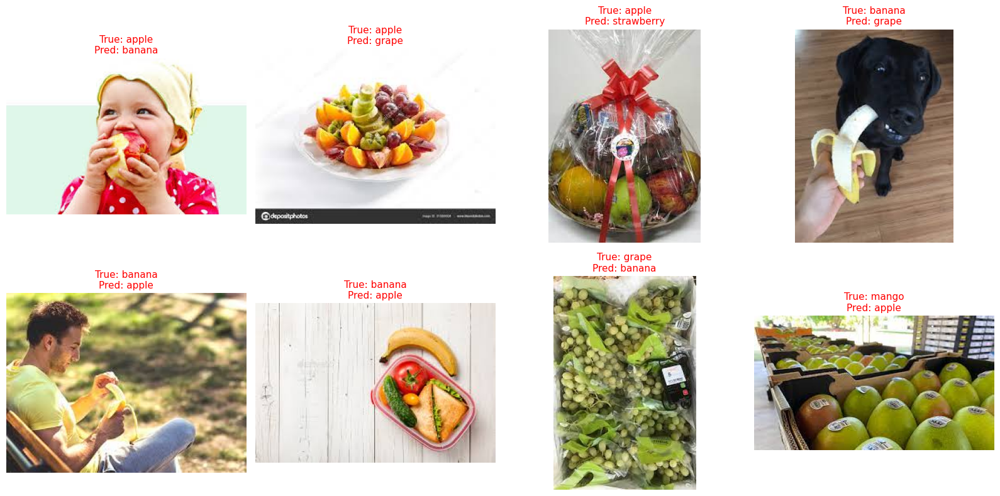

Most common errors:
  mango → apple: 3x
  banana → apple: 2x
  apple → banana: 1x
... +3 more errors

🔍 efficientnet_b1_20251008_095653.pth - Accuracy: 95.00% - Errors: 10


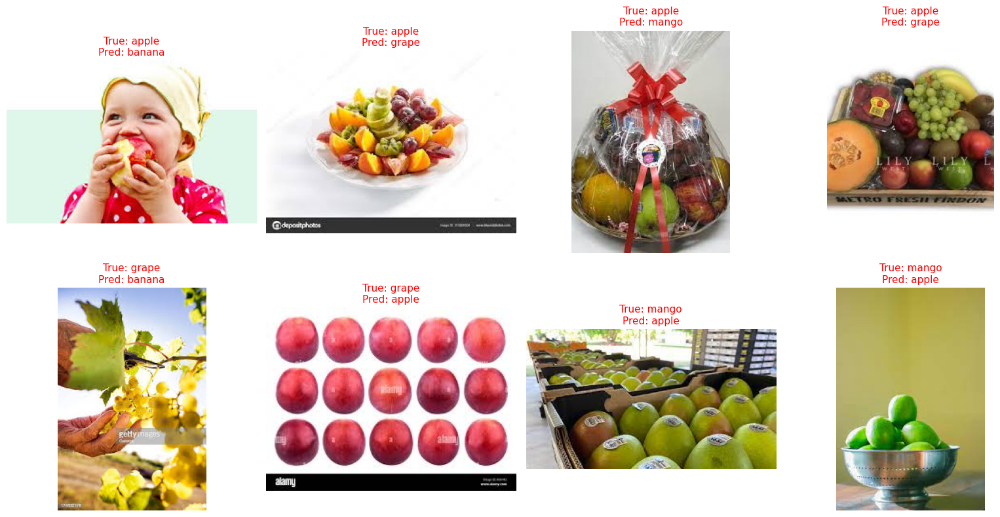

Most common errors:
  mango → apple: 3x
  apple → grape: 2x
  apple → banana: 1x
... +2 more errors

🔍 efficientnet_b2_20251008_103355.pth - Accuracy: 94.00% - Errors: 12


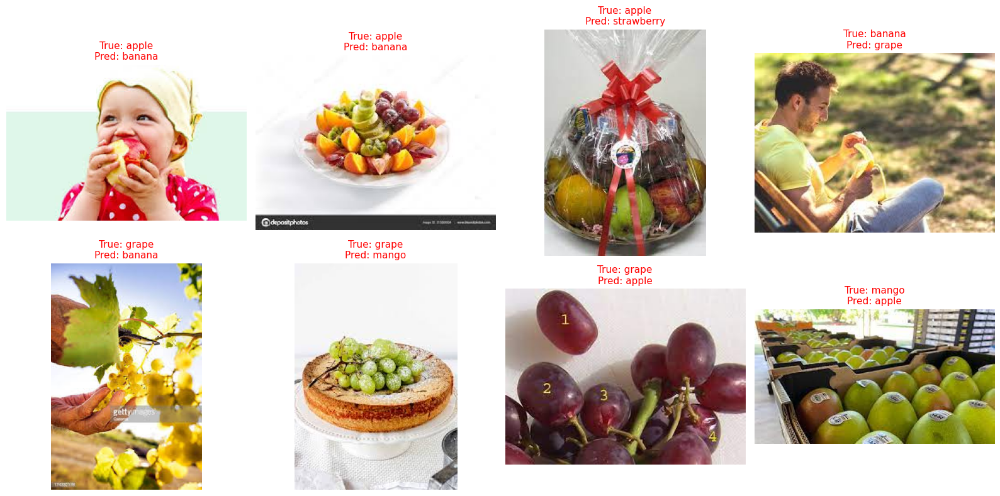

Most common errors:
  apple → banana: 2x
  mango → apple: 2x
  apple → strawberry: 1x
... +4 more errors

🔍 mobilenet_v3_large_20251007_231301.pth - Accuracy: 94.00% - Errors: 12


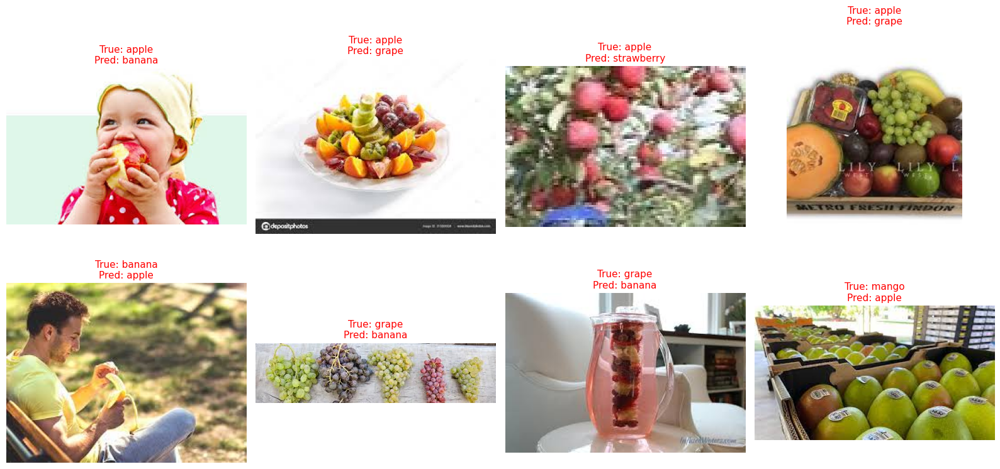

Most common errors:
  mango → apple: 4x
  apple → grape: 2x
  grape → banana: 2x
... +4 more errors

🔍 mobilenet_v3_small_20251008_001731.pth - Accuracy: 91.50% - Errors: 17


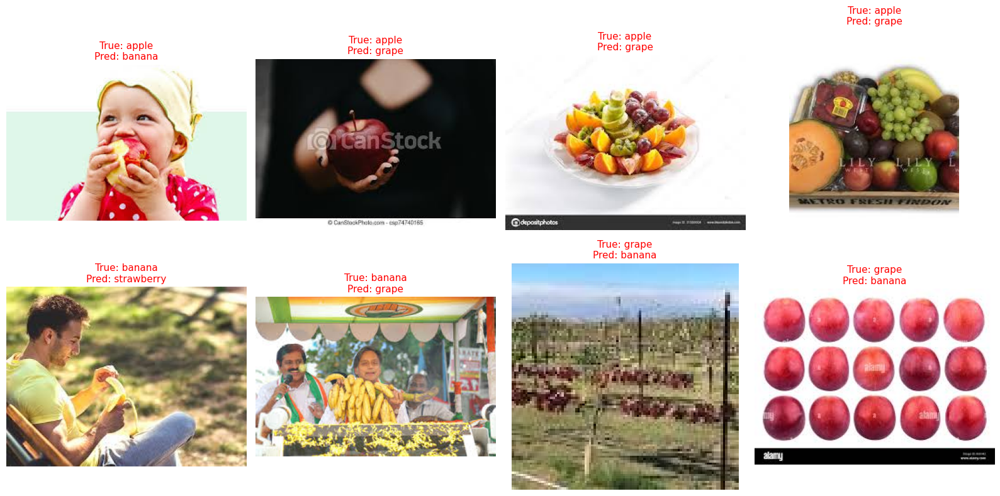

Most common errors:
  grape → banana: 5x
  apple → grape: 3x
  mango → apple: 3x
... +9 more errors

🔍 resnet18_20251008_122200.pth - Accuracy: 86.00% - Errors: 28


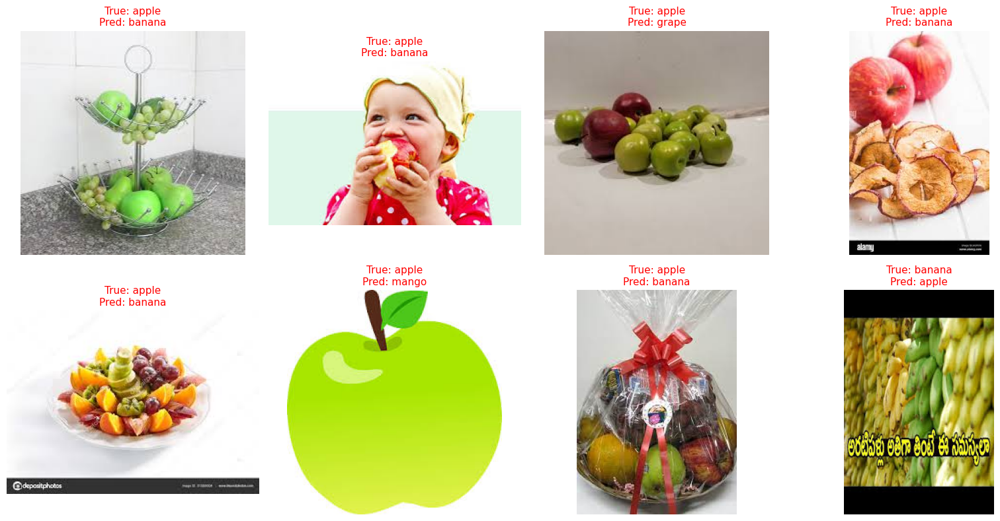

Most common errors:
  apple → banana: 5x
  mango → apple: 4x
  mango → grape: 3x
... +20 more errors

🔍 resnet50_20251008_131929.pth - Accuracy: 89.50% - Errors: 21


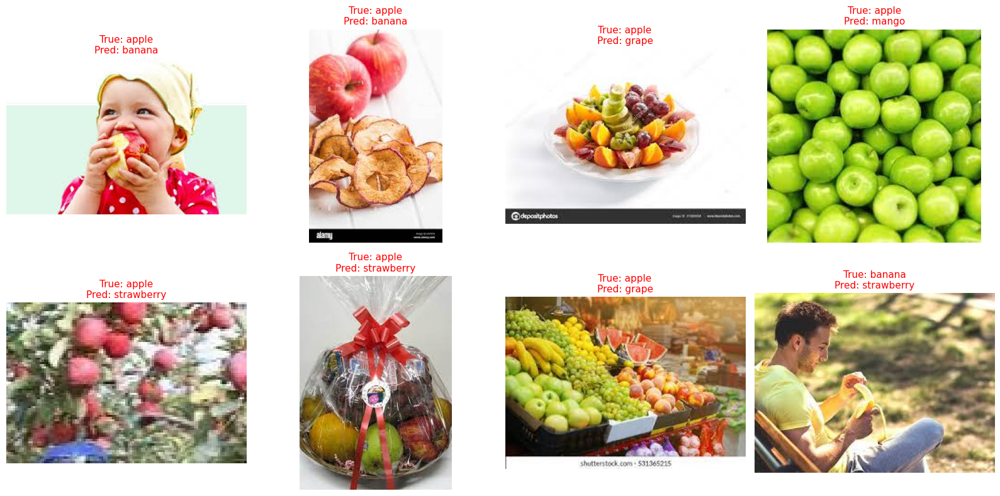

Most common errors:
  mango → apple: 3x
  apple → banana: 2x
  apple → grape: 2x
... +13 more errors

🔍 swin_t_20251008_220507.pth - Accuracy: 89.00% - Errors: 22


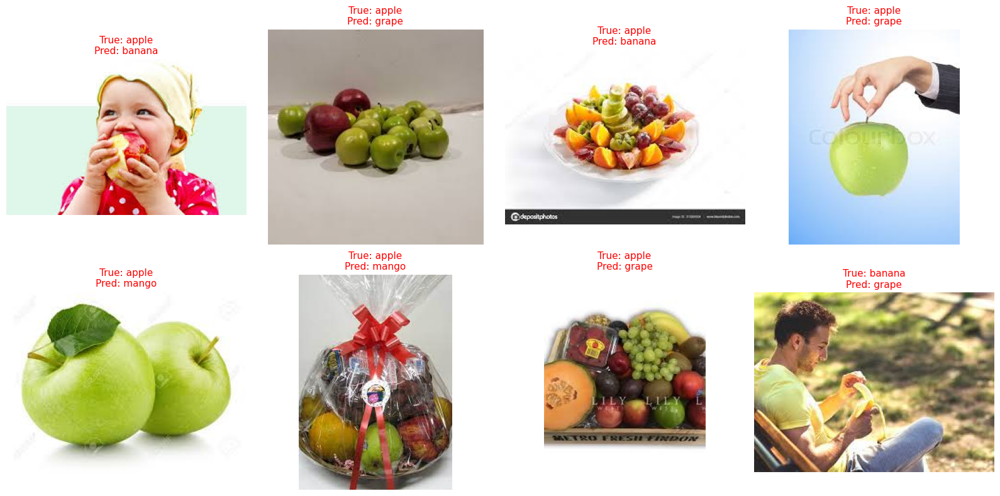

Most common errors:
  apple → grape: 3x
  grape → apple: 3x
  mango → apple: 3x
... +14 more errors



In [167]:
class2Label = {'banana': 0, 'strawberry': 1, 'grape': 2, 'apple': 3, 'mango': 4}
label2class = {v:k for k,v in class2Label.items()}

selected_models = []
freq_err = {}

for name,acc in best_result_per_model:
    match_names = [key for key in report if name in key and report[key]['acc'] == acc]
    selected_models.append(match_names[0])

for selected_model in selected_models:
    preds = report[selected_model]['pred']
    labels = report[selected_model]['labels']
    accuracy = report[selected_model]['acc']
    
    mask = np.where(np.array(preds) != np.array(labels))[0].tolist()
    err_paths = [report[selected_model]['path'][i] for i in mask]
    err_label = [labels[i] for i in mask]
    err_pred = [preds[i] for i in mask]
    
    print(f"🔍 {selected_model} - Accuracy: {accuracy:.2%} - Errors: {len(err_paths)}")

    for path in err_paths:
        if not path in freq_err.keys():
            freq_err[path] = 0
        freq_err[path]+=1
    
    if len(err_paths) > 0:
        # Mostrar apenas os primeiros 8 erros
        n_to_show = min(8, len(err_paths))
        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        axes = axes.flatten()
        
        for i in range(n_to_show):
            img = cv2.imread(err_paths[i], 1)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            axes[i].imshow(img)
            true_class = label2class[err_label[i]]
            pred_class = label2class[err_pred[i]]
            axes[i].set_title(f"True: {true_class}\nPred: {pred_class}", fontsize=11)
            axes[i].axis('off')
            
            # Cor vermelha para erros
            axes[i].title.set_color('red')
        
        # Esconder eixos não utilizados
        for j in range(n_to_show, len(axes)):
            axes[j].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Análise dos erros mais comuns
        from collections import Counter
        error_pairs = Counter(zip(err_label, err_pred))
        print("Most common errors:")
        for (true, pred), count in error_pairs.most_common(3):
            print(f"  {label2class[true]} → {label2class[pred]}: {count}x")
        
        if len(err_paths) > n_to_show:
            print(f"... +{len(err_paths) - n_to_show} more errors\n")
    else:
        print("✅ Perfect classification!\n")

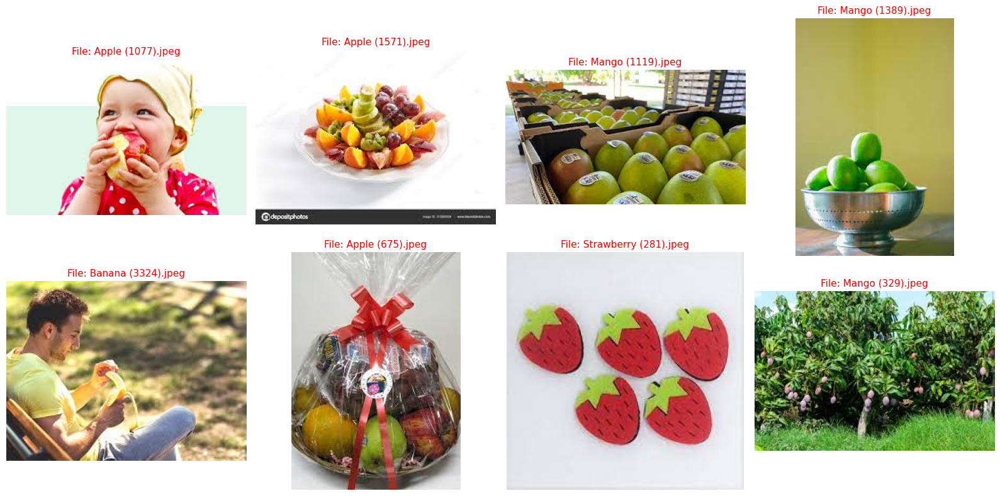

In [168]:
freq_err = dict(sorted(freq_err.items(), key=lambda item: item[1], reverse=True))

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()
n_freq = 8

keys = [key for key in freq_err.keys()]

for i in range(n_freq):
    img = cv2.imread(keys[i], 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    axes[i].imshow(img)
    true_class = os.path.basename(keys[i])
    axes[i].set_title(f"File: {true_class}", fontsize=11)
    axes[i].axis('off')
    
    # Cor vermelha para erros
    axes[i].title.set_color('red')

# Esconder eixos não utilizados
for j in range(n_to_show, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()